In [2]:
#2017-12-12
#A. Pendleton
#Genotyping ancients at XP-CLR and FST sites (ours, Axelsson,and Cagan/Blass)
#   through calculation of delta Hp

In [3]:
#this uses iPython magic to make plots appear inline
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import subprocess
import sys
import numpy as np
import matplotlib.patches as patches
import gzip
import fileinput
import glob
from scipy import stats
import re
from matplotlib_venn import venn3, venn3_circles

def count_lines(f):
    lineCount = 0
    with open(f, 'r') as f:
        for line in f:
            lineCount += 1
        return lineCount
def runCMD(cmd):
    val = subprocess.Popen(cmd, shell=True).wait()
    if val == 0:
        pass
    else:
        print ('command failed')
        print (cmd)
        sys.exit(1)

In [4]:
wkDir = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/'

In [5]:
resultsDir = wkDir + 'results/'
#No Ancients --- Ancients
fileRoots = ['53samples_auto.vqsr99.FILTERED_biallelic_geno0_recode.frq.count','53samples_Newgrange_HXH_auto.vqsr99.FILTERED_biallelic_geno0_recode.frq.count']


#  --------- FST ---------

In [7]:
#HpData = [chrom,start,end,NoAncientsHp,AncientsHp]
FST_HpData = {}
file_index = 0

for root in fileRoots:
    windowCount = 0 
    passWindowCount = 0 
    for line in open(resultsDir + root + '_FSTWindows_Hp', 'r'):
        if 'CHROM' in line: #skip header
            continue
        line=line.rstrip().split('\t')
        #How many windows have we processed
        windowCount += 1
        
        #What is this window's information
        chrom,start,end,Hp = line[0], int(line[1]),int(line[2]),float(line[4])
        coord = chrom + ':' + str(start) + '-' + str(end)
        
        #Want to use windows with at least 10 variants
        numVariants = int(line[3])
        if numVariants < 10:
            continue
        passWindowCount += 1 #how many windows pass
        
        #Save to array
        if file_index == 0:
            FST_HpData[coord] = [chrom,start,end,Hp,'AncientHp','DeltaHp'] #keep the with ancient Hp empty for now, will add in next loop
        else:
            FST_HpData[coord][4] = Hp
            NOancientHp = FST_HpData[coord][3]
            #Calculate the change in Hp from no Ancient (coord[3]) to adding Ancients (coord[4])
            deltaHp = NOancientHp - Hp
            #Save to dictionary
            FST_HpData[coord][5] = deltaHp    
        #break
    file_index +=1 
print('%i windows in total had Hp calculations' % windowCount)
print('%i windows were removed because they did not have at least ten variants' % (windowCount - passWindowCount))
print('Therefore, only %i windows went into delta Hp calculations' % passWindowCount)

#Save as array for later integrating with real data
fst_hpCoord = []
for key in FST_HpData.keys():
    fst_hpCoord.append(FST_HpData[key])
    


43959 windows in total had Hp calculations
205 windows were removed because they did not have at least ten variants
Therefore, only 43754 windows went into delta Hp calculations


In [8]:
df = pd.DataFrame(FST_HpData)
fstHp = pd.DataFrame.transpose(df)
fstHp.columns = ['Chrom', 'WindowStart','WindowEnd','NoAncientHp','AncientHp','DeltaHp']
fstHp.head()

fst_pct5,fst_pct1, fst_pct05, fst_pct01 = np.percentile(fstHp['DeltaHp'], 5),np.percentile(fstHp['DeltaHp'], 1), np.percentile(fstHp['DeltaHp'], .5), np.percentile(fstHp['DeltaHp'], .1)
fst_pct025 = np.percentile(fstHp['DeltaHp'], 0.25)
print('The simulated 5th percentile = ', fst_pct5)
print('The simulated 1st percentile = ', fst_pct1)
print('The simulated 0.5th percentile = ', fst_pct05)
print('The simulated 0.25th percentile = ', fst_pct025)
print('The simulated 0.1st percentile = ', fst_pct01)



The simulated 5th percentile =  -0.003563673621700013
The simulated 1st percentile =  -0.006773590949160003
The simulated 0.5th percentile =  -0.008382831908946502
The simulated 0.25th percentile =  -0.010097491156987494
The simulated 0.1st percentile =  -0.012445178184643003


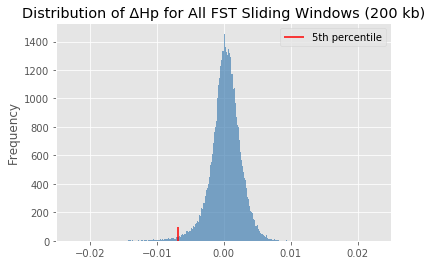

In [13]:
plt.style.use('ggplot')

binNum = round(len(fstHp)/500)

_ = fstHp['DeltaHp'].plot(kind='hist', label='',bins=200,xlim=(-0.025,0.025), normed = False,color='steelblue',alpha=0.7)
_ = plt.title(u'Distribution of ΔHp for All FST Sliding Windows (200 kb)')
_ = plt.vlines(x=fst_pct1,ymin=0,ymax=100,color='red',label='5th percentile')
_ = plt.legend()

## Now we need to only get the delta Hp for the windows thatare significant from FST

In [16]:
real_fstFile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Re-RunningAnalysis_NewScripts/FINAL_results/MergedOverlapping_Sliding_TotalSIGFstCalls_AutoXPar_54callset.bed'
real_fstCoord = []

for line in open(real_fstFile,'r'):
    if 'Start' in line: #skip header
        continue
    line=line.rstrip().split('\t')
    chrom,start,end,ID,FST = line[0],int(line[1]),int(line[2]),line[3], float(line[4])
    ID = ID.replace('CDR','FST')
    real_fstCoord.append([chrom,start,end,ID,FST,'Average Hp from No Ancients Data','Average Hp from WITH Ancients Data','Average Delta Hp','Ancients PASS/FAIL'])
print('%i real FST windows added... ' % len(real_fstCoord))

70 real FST windows added... 


In [17]:
#Getting the HP for our real fst data
failCount, windowCount = 0, 0
passWindows = []

for window in real_fstCoord:
    windowChrom, windowStart, windowEnd = window[0],int(window[1]),int(window[2])
    ancientHp_Window, noAncientHp_Window, deltaHp_Window = [], [], []
    windowCount += 1
    for hpwindow in fst_hpCoord:
        hpWindowChrom, hpWindowStart, hpWindowEnd, noancientHp, ancientHp, deltaHp = hpwindow[0],int(hpwindow[1]),int(hpwindow[2]), float(hpwindow[3]), float(hpwindow[4]), float(hpwindow[5])
        if hpWindowChrom == windowChrom: #same chromosome
            if windowStart <= hpWindowStart and hpWindowEnd <= windowEnd: #by the way I calculated these, they will have the same start coordinate and be the same size
                #print(hpwindow)
                ancientHp_Window.append(ancientHp)
                noAncientHp_Window.append(noancientHp)
                deltaHp_Window.append(deltaHp)
    """print('ancient', ancientHp_Window)
    print('no ancient', noAncientHp_Window)
    print('delta hp', deltaHp_Window)"""
    avg_ancientHp_Window  = np.mean(ancientHp_Window)
    avg_noAncientHp_Window  = np.mean(noAncientHp_Window)
    avg_deltaHp = np.mean(deltaHp_Window)
    window[5] = avg_noAncientHp_Window
    window[6] = avg_ancientHp_Window
    window[7] = avg_deltaHp
    #print(deltaHp_Window)
    if avg_deltaHp < fst_pct1:
        window[8] = 'FAIL'
        failCount += 1
    else:
        window[8] = 'PASS'
        passWindows.append(window)
    #print(window)
    
failProp = (failCount/float(windowCount)) * 100
print('%i/%i (%f) windows FAIL from our FST analysis' % (failCount,windowCount,failProp)) 



/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


9/70 (12.857143) windows FAIL from our FST analysis


In [11]:
fstDF = pd.DataFrame(real_fstCoord)
fstDF.columns = ['Chrom','Start','End','ID','Fst','No Ancient Hp', 'Ancient Hp', 'Delta Hp','Pass/Fail']

In [14]:
#Plotting ONLY our Fst windows
_ = fstDF['Delta Hp'].plot(kind='hist',label = u'Fst CDR ΔHp', bins=20, xlim=(-.025,.025),alpha=0.6, normed = False,color="royalblue")
_ = plt.vlines(x=fst_pct1,ymin=0,ymax=3,color='red')



NameError: name 'fstDF' is not defined

In [22]:
fstDF.loc[fstDF['Delta Hp'] < fst_pct1]


,Chrom,Start,End,ID,Fst,No Ancient Hp,Ancient Hp,Delta Hp,Pass/Fail
4,chr1,24400000,24600000,FST_5,0.411716,0.079062,0.090492,-0.011430,FAIL
18,chr4,56300000,56550000,FST_19,0.422143,0.075232,0.084732,-0.009500,FAIL
19,chr4,60050000,60300000,FST_20,0.411318,0.086254,0.093607,-0.007353,FAIL
28,chr6,46850000,47400000,FST_29,0.663777,0.061615,0.069705,-0.008090,FAIL
43,chr12,34950000,35150000,FST_44,0.399127,0.089700,0.101167,-0.011466,FAIL
51,chr16,16750000,17000000,FST_52,0.420783,0.053896,0.062609,-0.008713,FAIL
53,chr18,1300000,1800000,FST_54,0.491121,0.041838,0.048909,-0.007071,FAIL
57,chr18,15550000,15800000,FST_58,0.404372,0.073620,0.081054,-0.007434,FAIL
69,chr37,4150000,4550000,FST_70,0.443882,0.059762,0.067156,-0.007394,FAIL


### Drawing Genotype Matrices

In [15]:
genoDir = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/genotype_matrices/'

In [133]:
def plink_extract_snps(outDir,cmdFile,cdrfile):
    #keepSNPFile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Re-RunningAnalysis_NewScripts/ReProcessing_PrimaryCDRs_AxelssonMethods/TotalSNPSet_ToKeep_PerSite.txt'
    bimFile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Re-RunningAnalysis_NewScripts/ReProcessing_PrimaryCDRs_AxelssonMethods/GenotypeMatrices/input/CDRExtracted_89sample_ancient_Freedman_Lcu2_TotalSNPSet'

    for line in open(cdrfile,'r'):
        line=line.rstrip().split('\t')
        chrom,start,end, ID = line[0:4]
        if 'chrX' in chrom:
            continue
        
        if 'XP' in ID:
            num = int(ID.replace('XP-CLR_',''))
            if 'XP-CLR_63' in ID or 'XP-CLR_98' in ID or 'XP-CLR_137' in ID:
                continue

        #FOR GENOTYPE MATRICES --- MINOR ALLELE FREQ CUT OFFS
        #outFile = outDir + ID + '_ExtractedSNPs_MAF05-49_geno0_ForGenotypeMatrix'
        #cmd = 'plink-1.90 --dog --maf 0.05 --geno 0 --max-maf 0.49 --extract %s --bfile %s --chr %s --from-bp %s --to-bp %s --make-bed --out %s' % (keepSNPFile,bimFile, chrom, start, end, outFile)
        #FOR OUR REF ALLELE FREQS --- ONLY NORMAL MAF CUT OFFS
        keepSNPFile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/input/village_autos-X.snp.indel5.autoPar.vqsr99.FILTERED_biallelic.recode.frq.count.snps'
        outFile = outDir + ID + '_ExtractedSNPs_geno0'
        cmd = 'plink-1.90 --dog --geno 0 --extract %s --bfile %s --chr %s --from-bp %s --to-bp %s --make-bed --out %s' % (keepSNPFile,bimFile, chrom, start, end, outFile)
        runCMD(cmd)
        cmdFile.write('%s\n'%cmd)
########################################################################################################
def write_convertf_commands(outDir):
    #GENERATING THE CONVERTF COMMANDS TO MAKE EIGENSTRAT GENO FILES
    cmdfile = outDir + 'convertf_commands.cmds'
    cmdFile = open(cmdfile, 'w')
    #CHECK THIS!!!!
    #Each of my files had filt in the file names and were bed files. You need to change this 
    #	line to make sure that you are capturing all the bed files generated from the 
    #	commands written from the make_bed.py script
    for file in glob.glob(outDir + 'XP*bed'): #May need to change this to whatever consistent naming you have for all of your bed (PLINK) files (i.e. CDR, FST, filt, etc.)
        name=file.replace('.bed','')
        name=name.replace(outDir,'')
        f1=open(outDir + 'par_%s.convertf' %(name),"w")

        #CHECK THIS!!!!!
        #This needs to be the original, full SNP file that you originally used the make_bed.py
        #	script to pull the SNPs out of (your .bim file)
        f1.write("indivname:\t89sample_ancient_Freedman_Lcu2_all_geno0.ind\n") 
        f1.write("snpname:\t%s.bim\n" %(name))
        f1.write("genotypename:\t%s.bed\n" %(name))
        f1.write("outputformat:\tEIGENSTRAT\n")
        f1.write("genotypeoutname:\t%s.eigenstratgeno\n" %(name))
        f1.write("snpoutname:\t%s.snp\n" %(name))
        f1.write("indoutname:\t%s.ind\n" %(name))
        f1.write("familynames:\tNO\n")
        #This script will now write out commands to a command file called convert.cmds in 
        #the directory where you are running this script. You'll have to run the commands later.
        #But this command is calling a program that Shiya has installed in the software
        #directory of her own directory. Just make sure to remember to run the command file, haha.
        #cmds='/home/songsy/softwares/AdmixTools/src/convertf -p par_%s.convertf' %(name) 
        cmd = '/home/ampend/links/kidd-lab/progs/eigensoft/bin/convertf -p %spar_%s.convertf' % (outDir,name)
        cmdFile.write('%s\n'%(cmd))
        f1.close()
    cmdFile.close()

    cmd = 'chmod 777 %s' % cmdfile
    runCMD(cmd)
########################################################################################################
def make_matrix_transpositions(outDir):
    fHD_array = []
    sample_array = []
    sample_array.append('SNP_ID')

    #Generating the row column IDs based on the sample  names
    sampleFile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Re-RunningAnalysis_NewScripts/ReProcessing_PrimaryCDRs_AxelssonMethods/GenotypeMatrices/desc.txt'
    for line in open(sampleFile,'r'):
        line = line.split()
        if '#' in line[0]:
            continue
        sampleID = line[0]
        sample_array.append(sampleID)

    windowCount = 0 
    for file in glob.glob(outDir+"*.eigenstratgeno"):
        skip=False
        name=file.replace(".eigenstratgeno","")
        FH=open(file, 'r')
        windowCount+=1
        outfile = name + '_forMatrix.txt'
        outFile = open(outfile, 'w')
        print ('Writing new matrix to', outfile)
        
        #PARSING BIM FILE FOR SNP IDS
        bimfile = name + '.bim'
        snpList = []
        print(bimfile)
        for line in open(bimfile, 'r'):
            line = line.split()
            snpList.append(line[1])
            lenSNP = len(snpList)
            snp = '\n'.join(map(str,snpList))
        outFile.write("#SampleID\t"+"\t".join(map(str,snpList))+"\n")

        #PARSING EIGENSTRAT FILE FOR GENOTYPES
        lineNum = 0
        array=[]
        for line in FH:
            lineNum += 1
            line=list(line.rstrip())
            for i in range(0,len(line)):
                if '9' in line[i]: #9 === missing geno data
                    line[i] = '-'
            array.append(line)

        #TRANSPOSING MATRIX OF GENOTYPES WHERE COLUMNS == SNPS AND ROWS == SAMPLES
        print ('Generated transposed matrix for %i SNPs' % (lineNum))
        if lineNum < 10:
            skip = True
        matrix=np.array(array)
        #print ('matrix dimensions', matrix.shape)
        #print (matrix)
        new_matrix=matrix.T
        #print ('new matrix dimensions', new_matrix.shape)
        #if skip is True:

        for i in range(len(new_matrix)):
            outFile.write(sample_array[i+1]+"\t"+"\t".join(map(str,new_matrix[i]))+"\n")
        """else:
            print('deleting FH matrix file')
            cmd = 'rm %s' % outfile
            runCMD(cmd)"""
        outFile.close()
########################################################################################################
def make_genotype_matrix_plots(outDir):
    #Generating the plots with matrix2png
    for file in glob.glob(outDir+"*_sorted"):
        cmd = 'matrix2png -data %s -mincolor blue -midcolor white -maxcolor orange -r -c -g -size 20:20 -minsize 4000:2000 > %s.png' % (file,file)
        runCMD(cmd)
    print('DONE PLOTTING!')

In [137]:
#For making the genotype matrices
scriptDir = genoDir + 'scripts/' 
cmdFile = open(scriptDir + 'Plink_ExtractSNPCommands.cmds','w')
#Required for plink command
outDir = genoDir + 'results/'

#FST FILE
#cdrfile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Re-RunningAnalysis_NewScripts/FINAL_results/MergedOverlapping_Sliding_TotalSIGFstCalls_AutoXPar_54callset.bed'
#XP-CLR FILE
cdrfile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/XP-CLR/results/Campbell_No-MAF-Filter/50kbWindow_2kbGrid/Dogs_v_Wolves/SignificantWindows/Significant_1Window_simThreshold_AverageXP-CLRScore.txt'

#1. Extract SNPs
#plink_extract_snps(outDir,cmdFile,cdrfile)
cmdFile.close()

#2. Write conversion commands
write_convertf_commands(outDir)

print('STOP AND RUN CONVERTF COMMANDS')
#3. Make matrices
#make_matrix_transpositions(outDir)

#4. Sort the matrices
cmd = 'for file in $(ls %s*forMatrix.txt); do cat "$file" | awk \'NR<2{print $0;next}{print $0| "sort"}\' > "$file"_sorted; sed -i \'s/#//g\' "$file"_sorted; done;' % (outDir)
print(cmd)
###DONT KNOW WHY THIS ISNT WORKING --- DO THIS IN TERMINAL ####

#5. Plot the matrices
make_genotype_matrix_plots(outDir)

print('DONE')



STOP AND RUN CONVERTF COMMANDS
for file in $(ls /home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/genotype_matrices/results/*forMatrix.txt); do cat "$file" | awk 'NR<2{print $0;next}{print $0| "sort"}' > "$file"_sorted; sed -i 's/#//g' "$file"_sorted; done;
DONE PLOTTING!
DONE


### Draw Non-Ref Allele Prop Plots

In [105]:
def get_cdr_Dict(cdrfile):
    cdrDict = {}
    sweepLengths = 0
    for line in open(cdrfile,'r'):
        line = line.rstrip().split('\t')
        chrom,start,end,ID = line[0],int(line[1]),int(line[2]),line[3]
        cdrDict[ID] = [chrom,start,end,Fst]
        sweepLengths = sweepLengths + (end-start)
    print('%i FST CDR regions read into dictionary...' % len(cdrDict))
    print('%i bp of the genome within sweeps' % sweepLengths)
    return cdrDict 
####################################################################################################
def make_sample_dict(inDir):
    sampleFile = open(inDir + 'input/' + '89sample_ancient_Freedman_Lcu2_all_GF_filter_geno0_LabelFile.txt', 'r')
    sampleDict = {}
    for line in sampleFile:
        line=line.rstrip().split('\t')
        ID,desc,sampleType,longID = line[0],line[1],line[2],line[3]
        sampleDict[ID] = [desc,sampleType,longID]
    sampleFile.close()
    return sampleDict
####################################################################################################
def determine_plot_order():
    #Determining the order I want to plot the dogs in for the bar plot for reference allele proportions
    RDplotOrder = []
    inFile = open('/home/ampend/links/kidd-lab/ampend-projects/Angela/amy2b/input/' + 'rd-sample-plot-order-2.txt')
    for line in inFile:
        line = line.rstrip().split('\t')
        #We dont want to plot these two samples:
        if 'Lcu' in line[0]:
            continue
        if 'ysb' in line[0]:
            continue
        RDplotOrder.append([line[0],line[1],line[2],line[3],line[4]])
    inFile.close()
    print ('Number of samples to plot:', len(RDplotOrder))
    return RDplotOrder
####################################################################################################
def get_fst_dog_samples():
    #Determining the order I want to plot the dogs in for the bar plot for reference allele proportions
    fstDogs = []
    notFSTSample = ['Lcu','ysb','mxb']

    inFile = open('/home/ampend/links/kidd-lab/ampend-projects/Angela/Re-RunningAnalysis_NewScripts/new_results/Haplotype_Analysis/GenotypeProportions/input/GenomeSampleInfoTable-VillageGreyWolves_lowAdmix.txt', 'r')
    for line in inFile:
        line = line.rstrip().split('\t')
        sampleID = line[0]
        if 'sampleName' in sampleID: #skips header
            continue
        if sampleID in notFSTSample:
            continue
        if 'pen' in sampleID:
            fstDogs.append('IBW') #replaces penelope with IBW
            continue
        fstDogs.append(line[0])
    inFile.close()
    return fstDogs
####################################################################################################
# get list of counts of ref,alt givne VCF genotype
def gen_to_counts(gen):
    if gen == '.' :
        return (0,0)
    if gen == '0/0':
        return (2,0)
    if gen == '0/1':
        return (1,1)
    if gen == '1/0':
        return (1,1)
    if gen == '1/1':
        return (0,2)
    print (gen)
    sys.exit()

In [106]:
def create_genotype_dict(sampleDict):
    genotypeDict = {}
    for key in sampleDict.keys():
        genotypeDict[key] = []
    return genotypeDict
####################################################################################################
def parse_VCF(sampleDict,vcfFileName):
    sampleList = []
    genotypeDict = create_genotype_dict(sampleDict)
    snpCount = 0
    for line in gzip.open(vcfFileName, 'rb'):
        line=line.decode() #splits a byte formatted line (FROM THE GZIP FILE FORMAT)
        if line[0:2] == '##':
            continue
        if './.' in line: #skip missing genotypes
            continue
        if line[0:6] == '#CHROM':
            line = line.rstrip().split()
            header = line
            for i in range(9,len(header)):
                colToSample[i] = header[i]
                sampleIdentifier = header[i].split('_')[0]
                if 'HXHdog' in sampleIdentifier or 'CTCdog' in sampleIdentifier:
                    sampleIdentifier = sampleIdentifier.replace('dog','')
                if 'trim' in sampleIdentifier:
                    sampleIdentifier=sampleIdentifier.replace('trim','')
                if '_b' in sampleIdentifier:
                    sampleIdentifier=sampleIdentifier.replace('_b','')
                sampleToCol[sampleIdentifier] = i
                sampleList.append(sampleIdentifier)
            continue
        line = line.rstrip().split()
        c = 'chr' + str(line[0]) # chromosome
        if c != cdrChrom: #dont keep searching if it isn't the right chromosome
            continue
        p = int(line[1]) #snp position
        if p >= cdrStart and p <= cdrEnd: #if SNP is within the start/end of the CDR, then process site
            snpCount += 1
            for sn in sampleDict.keys():
                gen = line[sampleToCol[sn]].split(':')[0]
                gen = gen_to_counts(gen)
                genotypeDict[sn].append(gen)
                #data['siteList'][c][-1][2][0] += gen[0]
                #data['siteList'][c][-1][2][1] += gen[1]
    if snpCount > 10:
        return genotypeDict,snpCount
    else:
        return {},snpCount
####################################################################################################
def calc_prop_alternate_allele(genotypeDict,snpCount):
    altPropDict = {} #keep track of the proportion that is the alternate allele
    wolfProps, dogProps = [], []
    for key in genotypeDict:
        altPropDict[key] = [] #keep track of the proportion that is the alternate allele
        altCount = 0
        for genotype in range(0,len(genotypeDict[key])):
            ref,alt = genotypeDict[key][genotype][0],genotypeDict[key][genotype][1]
            altCount = altCount + alt
        propAlt = altCount/float(snpCount*2)
        propAlt = float("{0:.6f}".format(round(propAlt,6)))
        altPropDict[key] = propAlt
        for i in range(0,len(RDplotOrder)):
            #determine sample type
            canineType = RDplotOrder[i][2]
            sample = RDplotOrder[i][0]
            if sample != key:
                continue
            if canineType == 'Wolf':
                wolfProps.append(propAlt)
            if canineType == 'Village Dog' or canineType == 'Breed': #or canineType == 'AncientDog' 
                dogProps.append(propAlt)
        wolfAverage, dogAverage, dogSD = np.mean(wolfProps),np.mean(dogProps), np.std(dogProps)    
    return altPropDict, wolfAverage, dogAverage, dogSD
####################################################################################################
def draw_allele_prop_plots(RDplotOrder,fstDogs,altPropDict,dogAverage,wolfAverage,dogSD):
    #CLEARING OUT VARIABLES
    names, ticks, labels = [], [], {}
    labels['Fox']  = 1 
    #PLOTTING
    labelFont  = {'fontname':'Arial'}
    width = .75
    plt.figure(figsize=(11,7))
    for i in range(len(RDplotOrder)):
        canineType = RDplotOrder[i][2]
        sample = RDplotOrder[i][0]
        if canineType == 'Fox':
            color = 'lightgreen'
        elif canineType == 'Jackal':
            color = 'lightgreen'
        elif canineType == 'Coyote':
            color = 'darkgreen'
        elif canineType == 'Wolf':
            color = 'darkorange'
        elif canineType == 'AncientDog':
            color = 'red'
        elif canineType == 'Village Dog':
            color = 'mediumpurple'
        elif canineType == 'Breed':
            color = 'blue'
        elif canineType == 'New Guinea Singing Dog':
            color = 'steelblue'
        else:
            color = 'mediumpurple'
        if canineType in labels:
            if sample in fstDogs:
                _ = plt.bar(i,altPropDict[sample],width,align='center',color=color, hatch = '//')
            else:
                _ = plt.bar(i,altPropDict[sample],width,align='center',color=color)
        else:
            l = RDplotOrder[i][2]
            labels[l] = 1
            if l == 'Jackal':
                l = 'Fox and Jackal'
            if l == 'AncientDog':
                l = 'Ancient Dog'
            if l == 'VillageDog':
                l = 'Village Dog'
            if sample in fstDogs:
                _ = plt.bar(i,altPropDict[sample],width,align='center',color=color, hatch = '//')
            else:
                _ = plt.bar(i,altPropDict[sample],width,align='center',color=color)
        names.append(RDplotOrder[i][4])
        ticks.append(i)

    _ = plt.xticks(ticks,names,rotation=90,fontsize=7)
    _ = plt.xlim([-1,ticks[-1]+1])
    _ = plt.yticks([0,.1,.2,.3,.4,.5,.6,.7,.8,.9,1])
    #_ = plt.ylim([0,0.5])
    _ = plt.ylim([0,1])
    #plt.legend(loc=2)

    #Calculate average wolf non-ref 
    plt.axhline(y=dogAverage,color='black',linestyle='--',linewidth=2)

    #ADDING LABELS TO AXES AND TITLE TO PLOT
    plt.ylabel('Non-Reference Allele Proportion')
    dogProp = "{0:.2f}".format(round(dogAverage,3))
    wolfProp = "{0:.2f}".format(round(wolfAverage,3))
    plt.title('Non-Reference Allele Proportions - %s\n(Mean Prop.: Modern Dog = %s Wolf = %s)' % (cdr,dogProp,wolfProp))
    
    #GENERATING PLOT
    plt.tight_layout()
    plt.savefig(plotDir + cdr + '_NonReferenceAllelePropPlot.png')
####################################################################################################
def find_ancient_outliers(cutoffs,altPropDict):
    ancients = ['HXH','CTC','NewGrange']
    minCutoff,maxCutoff = float(cutoffs[0]),float(cutoffs[1])
    for sample in ancients:
        if sample == 'HXH':
            hxh = float(altPropDict[sample])
            if hxh < minCutoff or hxh > maxCutoff:
                hxh = str(hxh) + '***'
        if sample == 'CTC':
            ctc = float(altPropDict[sample])
            if ctc < minCutoff or ctc > maxCutoff:
                ctc = str(ctc) + '***'
        if sample == 'NewGrange':
            ngd = float(altPropDict[sample])
            if ngd < minCutoff or ngd > maxCutoff:
                ngd = str(ngd) + '***'

    return str(ctc),str(hxh),str(ngd)

In [109]:
#####Extracting only the SNPs went into the FST/XP-CLR analysis (7.6 million starting count)
keepSNPFile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/input/village_autos-X.snp.indel5.autoPar.vqsr99.FILTERED_biallelic.recode.frq.count.snps'
wkDir = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/NonRef_AlleleProp_Plots/'

bimFile = wkDir + 'input/89sample_ancient_Freedman_Lcu2_all_geno0'
outFile = wkDir + 'input/' +'FSTExtracted_SNPs'

#Make a bed/bim file 
cmd = 'plink-1.90 --dog --extract %s --bfile %s --make-bed --out %s' % (keepSNPFile,bimFile,outFile)
runCMD(cmd)
print(cmd)

#Make a VCF file 
cmd = 'plink-1.90 --dog --bfile %s --recode vcf --out %s' % (outFile, outFile)
print(cmd)
runCMD(cmd)

#GZIP the output VCF
cmd = 'gzip %s.vcf' % (outFile)
print(cmd)
runCMD(cmd)

plink-1.90 --dog --extract /home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/input/village_autos-X.snp.indel5.autoPar.vqsr99.FILTERED_biallelic.recode.frq.count.snps --bfile /home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/NonRef_AlleleProp_Plots/input/89sample_ancient_Freedman_Lcu2_all_geno0 --make-bed --out /home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/NonRef_AlleleProp_Plots/input/FSTExtracted_SNPs
plink-1.90 --dog --bfile /home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/NonRef_AlleleProp_Plots/input/FSTExtracted_SNPs --recode vcf --out /home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/NonRef_AlleleProp_Plots/input/FSTExtracted_SNPs


70 FST CDR regions read into dictionary...
22766679 bp of the genome within sweeps
Number of samples to plot: 98
#FST_1 chr1 2400000 3350000


/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_methods.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice
  warnings.warn("Degrees of freedom <= 0 for slice", RuntimeWarning)
/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_methods.py:94: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_method

#FST_2 chr1 3400000 3600000
#FST_3 chr1 16600000 16800000
#FST_4 chr1 21100000 21300000
#FST_5 chr1 24400000 24600000
#FST_6 chr1 57750000 57950000
#FST_7 chr1 63400000 63750000
#FST_8 chr1 64800000 65000000
#FST_9 chr1 79800000 80250000
#FST_10 chr2 3700000 3950000
#FST_11 chr2 7200000 7500000
#FST_12 chr2 44800000 45000000
#FST_13 chr2 47650000 48100000
#FST_14 chr3 18700000 19100000
#FST_15 chr3 49000000 49350000
#FST_16 chr4 14400000 14600000
#FST_17 chr4 17200000 17400000
#FST_18 chr4 40750000 41100000
#FST_19 chr4 56300000 56550000
#FST_20 chr4 60050000 60300000
#FST_21 chr5 3800000 4300000


/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


#FST_22 chr5 42700000 42900000
#FST_23 chr5 77000000 77300000
#FST_24 chr5 80500000 80750000
#FST_25 chr6 24900000 25250000
#FST_26 chr6 34250000 34600000
#FST_27 chr6 39900000 40200000
#FST_28 chr6 40400000 40700000
#FST_29 chr6 46850000 47400000
#FST_30 chr6 53200000 53550000
#FST_31 chr7 56350000 56800000
#FST_32 chr7 60150000 60400000
#FST_33 chr8 13050000 13250000
#FST_34 chr8 14650000 14900000
#FST_35 chr9 10600000 10850000
#FST_36 chr9 13550000 14050000
#FST_37 chr9 14200000 14650000
#FST_38 chr10 3650000 4150000
#FST_39 chr11 1800000 2050000
#FST_40 chr11 37700000 38050000
#FST_41 chr11 46700000 46900000
#FST_42 chr11 52150000 52400000
#FST_43 chr11 52700000 52950000
#FST_44 chr12 34950000 35150000
#FST_45 chr12 67750000 68000000
#FST_46 chr14 60800000 60966679
#FST_47 chr15 5050000 5700000
#FST_48 chr15 11950000 12150000
#FST_49 chr15 18000000 18200000
#FST_50 chr16 7150000 7350000
#FST_51 chr16 8800000 9100000
#FST_52 chr16 16750000 17000000
#FST_53 chr18 250000 1150000
#FST_

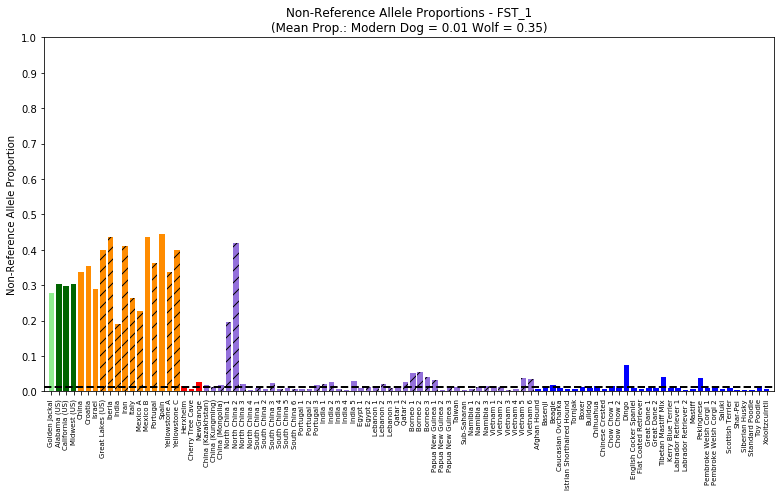

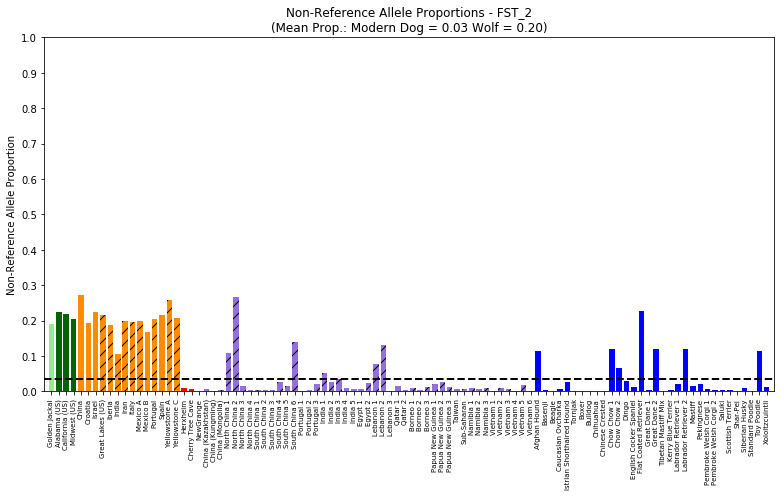

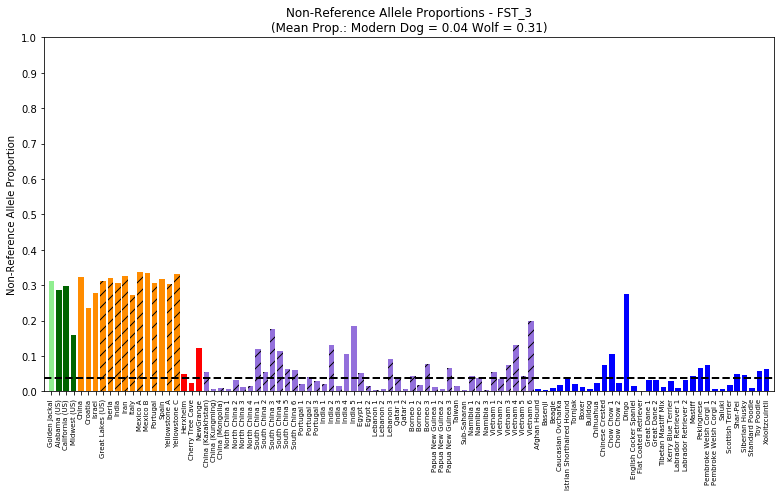

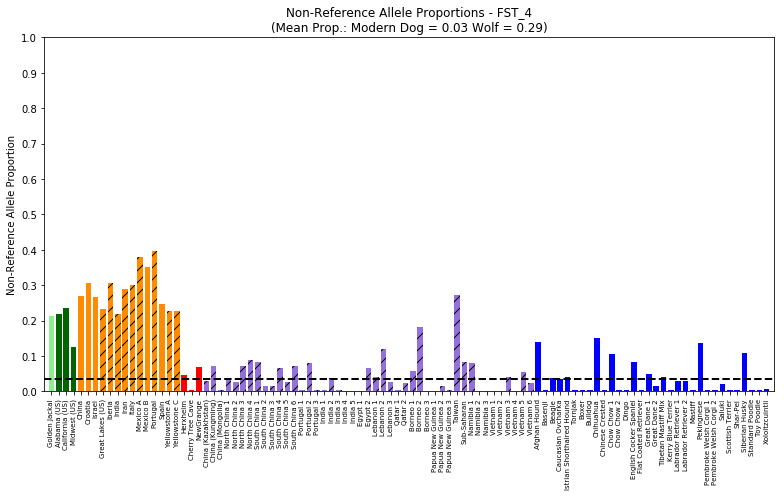

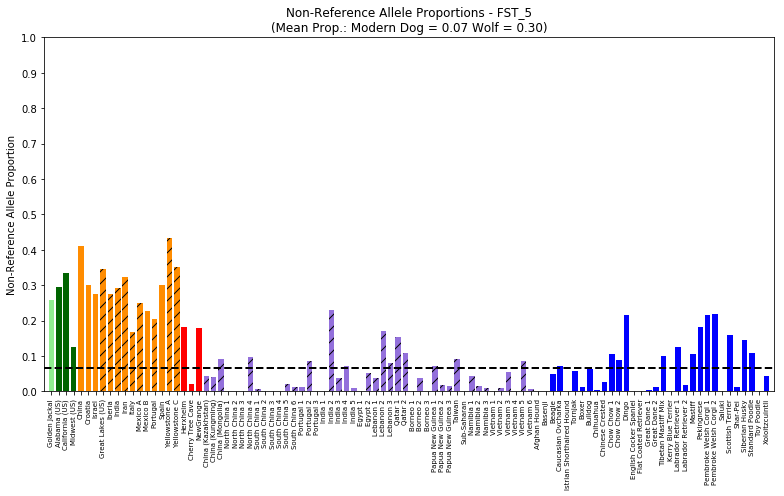

...

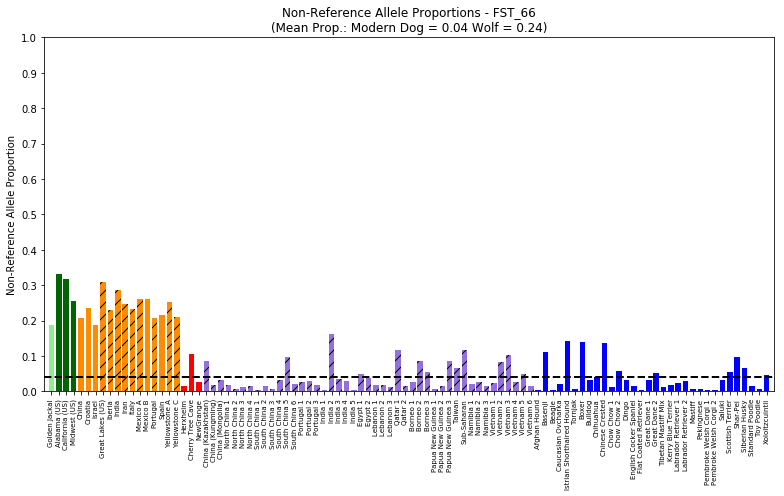

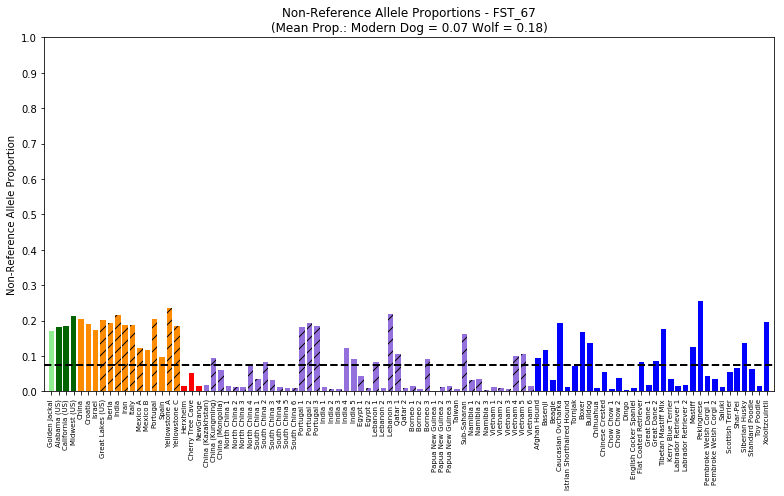

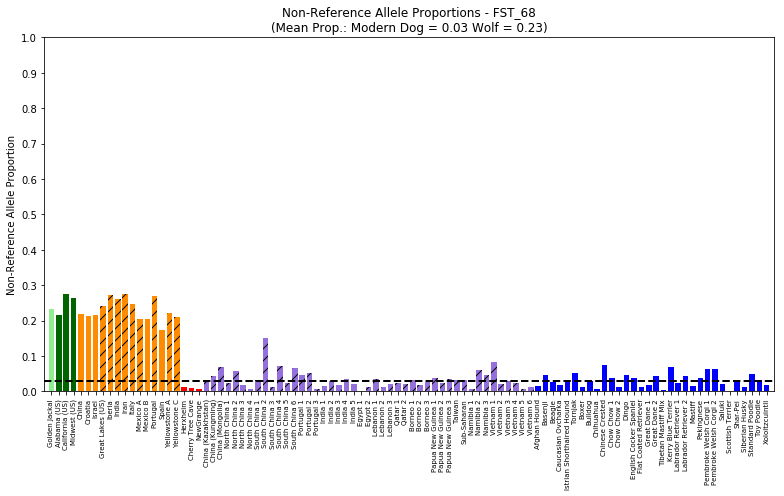

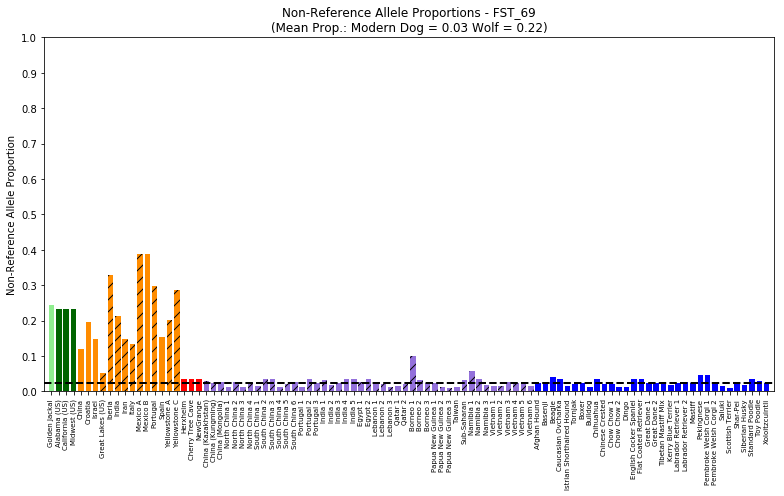

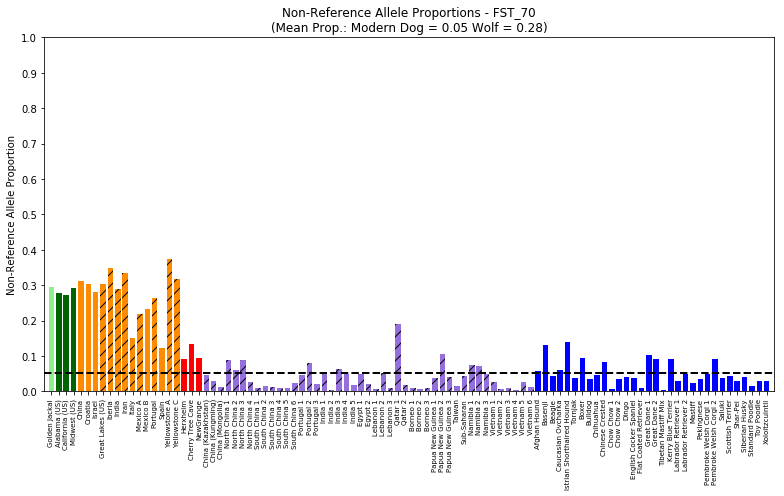

In [138]:
#Pendleton Primary FST sweeps
hapDir = wkDir
cdrfile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Re-RunningAnalysis_NewScripts/FINAL_results/MergedOverlapping_Sliding_TotalSIGFstCalls_AutoXPar_54callset.bed'
cdrDict = get_cdr_Dict(cdrfile)

sampleDict = make_sample_dict(hapDir) #make dictionary of the canine IDs and types
RDplotOrder = determine_plot_order() #determine the order that the samples should be plotted
fstDogs = get_fst_dog_samples()

altPropSummaryFile = open(hapDir + 'results/' + 'AncientAlternateAlleleProportions_PrimaryFST.txt','w')
#write header for ancient alt allele prop file
altPropSummaryFile.write('CDR_ID\tCDR_Coordinates\tDog_AltProp_Average\tWolf_AltProp_Average\tMax_Dog_AltProp\tHXH_AltProp\tCTC_AltProp\tNGD_AltProp\n')

for cdr in range(1,len(cdrDict)+1):
    cdr = 'FST' + '_' + str(cdr)
    cdrChrom,cdrStart,cdrEnd = cdrDict[cdr][0],int(cdrDict[cdr][1]),int(cdrDict[cdr][2])
    if 'X' in cdrChrom:
        continue
    print('#%s' % cdr,cdrChrom,cdrStart,cdrEnd)
    colToSample,sampleToCol = {},{}
    vcfFileName = hapDir + 'input/' + 'FSTExtracted_SNPs.vcf.gz'
    genotypeDict, snpCount = parse_VCF(sampleDict,vcfFileName)
    if len(genotypeDict) < 1: #This region didn't meet the SNP count requirement (SNPs>10)
        altPropSummaryFile.write('%s\t%s:%i-%i\t%s\t%s\t%s\t%s\t%s\t%s\n' % (cdr,cdrChrom,cdrStart,cdrEnd,'NA','NA','NA','NA','NA','NA'))
        continue
    altPropDict, wolfAverage, dogAverage,dogSD = calc_prop_alternate_allele(genotypeDict,snpCount)
    #print ancient averages
    cutoffs = [dogAverage-(2*dogSD),dogAverage+(2*dogSD)]
    ctc,hxh,ngd = find_ancient_outliers(cutoffs,altPropDict)
    altPropSummaryFile.write('%s\t%s:%i-%i\t%f\t%f\t%s\t%s\t%s\t%s\n' % (cdr,cdrChrom,cdrStart,cdrEnd,dogAverage,wolfAverage,"{0:.2f}".format(round(cutoffs[1],5)),hxh,ctc,ngd))
    #Draw bar plots of the region

    plotDir = hapDir + 'plots/'
    draw_allele_prop_plots(RDplotOrder,fstDogs,altPropDict,dogAverage,wolfAverage,dogSD)
    #break
altPropSummaryFile.close()

In [124]:
########################################################################################################

#  --------- XP-CLR ---------


In [23]:
#HpData = [chrom,start,end,NoAncientsHp,AncientsHp]
XPCLR_HpData = {}
file_index = 0

for root in fileRoots:
    windowCount = 0 
    passWindowCount = 0 
    for line in open(resultsDir + root + '_XP-CLRWindows_Hp', 'r'):
        if 'CHROM' in line: #skip header
            continue
        line=line.rstrip().split('\t')
        #How many windows have we processed
        windowCount += 1
        
        #What is this window's information
        chrom,start,end,Hp = line[0], int(line[1]),int(line[2]),float(line[4])
        coord = chrom + ':' + str(start) + '-' + str(end)
        
        #Want to use windows with at least 10 variants
        numVariants = int(line[3])
        if numVariants < 10:
            continue
        passWindowCount += 1 #how many windows pass
        
        #Save to array
        if file_index == 0:
            XPCLR_HpData[coord] = [chrom,start,end,Hp,'AncientHp','DeltaHp'] #keep the with ancient Hp empty for now, will add in next loop
        else:
            XPCLR_HpData[coord][4] = Hp
            NOancientHp = XPCLR_HpData[coord][3]
            #Calculate the change in Hp from no Ancient (coord[3]) to adding Ancients (coord[4])
            deltaHp = NOancientHp - Hp
            #Save to dictionary
            XPCLR_HpData[coord][5] = deltaHp    
        #break
    file_index +=1 
print('%i windows in total had Hp calculations' % windowCount)
print('%i windows were removed because they did not have at least ten variants' % (windowCount - passWindowCount))
print('Therefore, only %i windows went into delta Hp calculations' % passWindowCount)

#Save as array for later integrating with real data
xp_hpCoord = []
for key in XPCLR_HpData.keys():
    xp_hpCoord.append(XPCLR_HpData[key])
    


220226 windows in total had Hp calculations
12867 windows were removed because they did not have at least ten variants
Therefore, only 207359 windows went into delta Hp calculations


In [24]:
df = pd.DataFrame(XPCLR_HpData)
xpclrHp = pd.DataFrame.transpose(df)
xpclrHp.columns = ['Chrom', 'WindowStart','WindowEnd','NoAncientHp','AncientHp','DeltaHp']
xpclrHp.head()

xp_pct5, xp_pct1, xp_pct05, xp_pct01 = np.percentile(xpclrHp['DeltaHp'], 5), np.percentile(xpclrHp['DeltaHp'], 1), np.percentile(xpclrHp['DeltaHp'], .5), np.percentile(xpclrHp['DeltaHp'], .1)
xp_pct025 = np.percentile(xpclrHp['DeltaHp'], 0.25)
print('The simulated 5th percentile = ', xp_pct5)
print('The simulated 1st percentile = ', xp_pct1)
print('The simulated 0.5th percentile = ', xp_pct05)
print('The simulated 0.25th percentile = ', xp_pct025)
print('The simulated 0.1st percentile = ', xp_pct01)




The simulated 5th percentile =  -0.006555850260400006
The simulated 1st percentile =  -0.011876299697839992
The simulated 0.5th percentile =  -0.014313230341770008
The simulated 0.25th percentile =  -0.01669505895607501
The simulated 0.1st percentile =  -0.019688587389950198


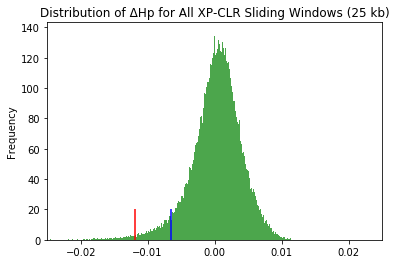

In [146]:
#Plotting the XP-CLR Distribution
binNum = round(len(xpclrHp)/200)
_ = xpclrHp['DeltaHp'].plot(kind='hist',label = 'Simulation Fst', bins=binNum,xlim=(-0.025,0.025), normed = True,color='green',alpha=0.7)
_ = plt.title(u'Distribution of ΔHp for All XP-CLR Sliding Windows (25 kb)')
_ = plt.vlines(x=xp_pct1,ymin=0,ymax=20,label='1st percentile',color='red')
_ = plt.vlines(x=xp_pct5,ymin=0,ymax=20,label='5th percentile',color='blue')


### Now we need to only get the delta Hp for the windows thatare significant from FST

In [25]:
#Final XP-CLR file to intersect everything against (it has the average XP-CLR value in this also --- not a 4 column bed file)
real_xpclrFile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/XP-CLR/results/Campbell_No-MAF-Filter/50kbWindow_2kbGrid/Dogs_v_Wolves/SignificantWindows/Significant_1Window_simThreshold_AverageXP-CLRScore.txt'
real_xpclrCoord = []

for line in open(real_xpclrFile,'r'):
    if 'Start' in line: #skip header
        continue
    line=line.rstrip().split('\t')
    chrom,start,end,ID,FST = line[0],int(line[1]),int(line[2]),line[3], float(line[6])
    ID = ID.replace('CDR','FST')
    real_xpclrCoord.append([chrom,start,end,ID,FST,'Average Hp from No Ancients Data','Average Hp from WITH Ancients Data','Average Delta Hp','Ancients PASS/FAIL'])
print('%i real XP-CLR windows added... ' % len(real_xpclrCoord))

271 real XP-CLR windows added... 


In [32]:
#Getting the HP for our real fst data
failCount, windowCount = 0, 0
passWindows = []

for window in real_xpclrCoord:
    windowChrom, windowStart, windowEnd = window[0],int(window[1]),int(window[2])
    ancientHp_Window, noAncientHp_Window, deltaHp_Window = [], [], []
    windowCount += 1
    for hpwindow in xp_hpCoord:
        hpWindowChrom, hpWindowStart, hpWindowEnd, noancientHp, ancientHp, deltaHp = hpwindow[0],int(hpwindow[1]),int(hpwindow[2]), float(hpwindow[3]), float(hpwindow[4]), float(hpwindow[5])
        if hpWindowChrom == windowChrom: #same chromosome
            if windowStart <= hpWindowStart and hpWindowEnd <= windowEnd: #by the way I calculated these, they will have the same start coordinate and be the same size
                #print(hpwindow)
                ancientHp_Window.append(ancientHp)
                noAncientHp_Window.append(noancientHp)
                deltaHp_Window.append(deltaHp)
    #Calculate Averages per XP-CLR window
    avg_ancientHp_Window  = np.mean(ancientHp_Window)
    avg_noAncientHp_Window  = np.mean(noAncientHp_Window)
    avg_deltaHp = np.mean(deltaHp_Window)
    #save these averages
    window[5] = avg_noAncientHp_Window
    window[6] = avg_ancientHp_Window
    window[7] = avg_deltaHp
    #If >0 then the ancients do not have the "dog" genotype
    if avg_deltaHp < xp_pct5:
        window[8] = 'FAIL'
        print(window)
        failCount += 1
    else:
        window[8] = 'PASS'
        passWindows.append(window)
    
    #print(window)
failProp = (failCount/float(windowCount)) * 100
print('%i/%i (%f%%) windows fail from our XP-CLR analysis' % (failCount,windowCount,failProp)) 



/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


['chr2', 13800001, 13825000, 'XP-CLR_19', 55.639, 0.070102751136200001, 0.0776383308577, -0.0075355797214999992, 'FAIL']
['chr3', 72850001, 72885000, 'XP-CLR_42', 24.053, 0.10493827160499999, 0.122301478433, -0.017363206828000008, 'FAIL']
['chr6', 46920001, 47095000, 'XP-CLR_64', 42.489, 0.044733025917225, 0.055244951652700006, -0.010511925735474999, 'FAIL']
['chr8', 7390001, 7415000, 'XP-CLR_86', 30.486, 0.044465357557999997, 0.0526425354151, -0.0081771778571000028, 'FAIL']
['chr12', 35130001, 35155000, 'XP-CLR_147', 36.296, 0.047356104203899997, 0.055380055543899999, -0.0080239513400000018, 'FAIL']
['chr20', 43910001, 43945000, 'XP-CLR_196', 20.054, 0.030666703870789999, 0.038325465290399999, -0.0076587614196100013, 'FAIL']
['chr24', 35650001, 35685000, 'XP-CLR_226', 27.026, 0.047991498048349998, 0.055078500020199997, -0.0070870019718499988, 'FAIL']
['chr33', 22660001, 22685000, 'XP-CLR_254', 35.051, 0.061588280207600002, 0.074150113204299997, -0.012561832996699995, 'FAIL']
['chr35',

In [27]:
xpDF = pd.DataFrame(real_xpclrCoord)
xpDF.columns = ['Chrom','Start','End','ID','XP','No Ancient Hp', 'Ancient Hp', 'Delta Hp','Pass/Fail']

In [ ]:
_ = xpDF['Delta Hp'].plot(kind='hist',label = u'XP-CLR CDR ΔHp', bins=20, xlim=(-.025,.025),alpha=0.6, normed = False,color="green")
_ = plt.vlines(x=xp_pct5,ymin=0,ymax=20,color='blue')



In [31]:
xpDF.loc[xpDF['Delta Hp'] < xp_pct5]
#len(xpDF.loc[xpDF['Delta Hp'] < xp_pct5])

,Chrom,Start,End,ID,XP,No Ancient Hp,Ancient Hp,Delta Hp,Pass/Fail
18,chr2,13800001,13825000,XP-CLR_19,55.639,0.070103,0.077638,-0.007536,PASS
41,chr3,72850001,72885000,XP-CLR_42,24.053,0.104938,0.122301,-0.017363,FAIL
63,chr6,46920001,47095000,XP-CLR_64,42.489,0.044733,0.055245,-0.010512,PASS
85,chr8,7390001,7415000,XP-CLR_86,30.486,0.044465,0.052643,-0.008177,PASS
146,chr12,35130001,35155000,XP-CLR_147,36.296,0.047356,0.055380,-0.008024,PASS
195,chr20,43910001,43945000,XP-CLR_196,20.054,0.030667,0.038325,-0.007659,PASS
225,chr24,35650001,35685000,XP-CLR_226,27.026,0.047991,0.055079,-0.007087,PASS
253,chr33,22660001,22685000,XP-CLR_254,35.051,0.061588,0.074150,-0.012562,FAIL
259,chr35,14420001,14455000,XP-CLR_260,21.588,0.062569,0.080380,-0.017811,FAIL


In [ ]:
#For making the genotype matrices
scriptDir = genoDir + 'scripts/' 
cmdFile = open(scriptDir + 'Plink_ExtractSNPCommands.cmds','w')
#Required for plink command
outDir = genoDir + 'results/'

#XP-CLR FILE
cdrfile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/XP-CLR/results/Campbell_No-MAF-Filter/50kbWindow_2kbGrid/Dogs_v_Wolves/SignificantWindows/Significant_1Window_simThreshold_AverageXP-CLRScore.txt'

#1. Extract SNPs
plink_extract_snps(outDir,cmdFile,cdrfile)
cmdFile.close()

#2. Write conversion commands
write_convertf_commands(outDir)

print('STOP AND RUN CONVERTF COMMANDS')
#3. Make matrices
#make_matrix_transpositions(outDir)

#4. Sort the matrices
cmd = 'for file in $(ls %s*forMatrix.txt); do cat "$file" | awk \'NR<2{print $0;next}{print $0| "sort"}\' > "$file"_sorted; sed -i \'s/#//g\' "$file"_sorted; done;' % (outDir)
print(cmd)
###DONT KNOW WHY THIS ISNT WORKING --- DO THIS IN TERMINAL ####

#5. Plot the matrices
#make_genotype_matrix_plots(outDir)

print('DONE')



### Non-Reference Allele Prop Plots

In [139]:
#####Extracting only the SNPs went into the FST/XP-CLR analysis (7.6 million starting count)
keepSNPFile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/input/village_autos-X.snp.indel5.autoPar.vqsr99.FILTERED_biallelic.recode.frq.count.snps'
wkDir = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/NonRef_AlleleProp_Plots/'

bimFile = wkDir + 'input/89sample_ancient_Freedman_Lcu2_all_geno0'
outFile = wkDir + 'input/' +'XP-CLRExtracted_SNPs'

#Make a bed/bim file 
cmd = 'plink-1.90 --dog --extract %s --bfile %s --make-bed --out %s' % (keepSNPFile,bimFile,outFile)
runCMD(cmd)
print(cmd)

#Make a VCF file 
cmd = 'plink-1.90 --dog --bfile %s --recode vcf --out %s' % (outFile, outFile)
print(cmd)
runCMD(cmd)

#GZIP the output VCF
cmd = 'gzip %s.vcf' % (outFile)
print(cmd)
runCMD(cmd)

plink-1.90 --dog --extract /home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/input/village_autos-X.snp.indel5.autoPar.vqsr99.FILTERED_biallelic.recode.frq.count.snps --bfile /home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/NonRef_AlleleProp_Plots/input/89sample_ancient_Freedman_Lcu2_all_geno0 --make-bed --out /home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/NonRef_AlleleProp_Plots/input/XP-CLRExtracted_SNPs
plink-1.90 --dog --bfile /home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/NonRef_AlleleProp_Plots/input/XP-CLRExtracted_SNPs --recode vcf --out /home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/NonRef_AlleleProp_Plots/input/XP-CLRExtracted_SNPs
gzip /home/ampend/links/kidd-lab/ampend-projects/Angela/Ancient_Genotyping_at_Sweeps/NonRef_AlleleProp_Plots/input/XP-CLRExtracted_SNPs.vcf


271 FST CDR regions read into dictionary...
13424729 bp of the genome within sweeps
Number of samples to plot: 98
#XP-CLR_1 chr1 12770001 12795000


/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_methods.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice
  warnings.warn("Degrees of freedom <= 0 for slice", RuntimeWarning)
/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_methods.py:94: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/numpy/core/_method

#XP-CLR_2 chr1 19790001 19835000
#XP-CLR_3 chr1 20390001 20415000
#XP-CLR_4 chr1 21090001 21115000
#XP-CLR_5 chr1 24990001 25015000
#XP-CLR_6 chr1 39080001 39105000
#XP-CLR_7 chr1 45870001 45905000
#XP-CLR_8 chr1 62560001 62595000
#XP-CLR_9 chr1 63810001 63835000
#XP-CLR_10 chr1 65100001 65125000
#XP-CLR_11 chr1 79580001 79615000
#XP-CLR_12 chr1 79710001 79915000
#XP-CLR_13 chr1 80210001 80245000
#XP-CLR_14 chr1 80440001 80465000
#XP-CLR_15 chr1 80830001 80865000
#XP-CLR_16 chr2 4140001 4165000
#XP-CLR_17 chr2 7270001 7355000
#XP-CLR_18 chr2 13100001 13135000
#XP-CLR_19 chr2 13800001 13825000
#XP-CLR_20 chr2 13950001 14005000
#XP-CLR_21 chr2 35060001 35085000
#XP-CLR_22 chr2 36440001 36485000


/sw/lsa/centos7/python-anaconda-arc-connect/created-20170421/lib/python3.5/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


#XP-CLR_23 chr2 37400001 37435000
#XP-CLR_24 chr2 43100001 43125000
#XP-CLR_25 chr2 43590001 43635000
#XP-CLR_26 chr2 43710001 43745000
#XP-CLR_27 chr2 43810001 43885000
#XP-CLR_28 chr2 47710001 47765000
#XP-CLR_29 chr2 47900001 47925000
#XP-CLR_30 chr2 59150001 59175000
#XP-CLR_31 chr2 60060001 60085000
#XP-CLR_32 chr2 60170001 60195000
#XP-CLR_33 chr2 74950001 74985000
#XP-CLR_34 chr2 84830001 84895000
#XP-CLR_35 chr3 11330001 11355000
#XP-CLR_36 chr3 15720001 15745000
#XP-CLR_37 chr3 17590001 17615000
#XP-CLR_38 chr3 18840001 18865000
#XP-CLR_39 chr3 18960001 19005000
#XP-CLR_40 chr3 43430001 43465000
#XP-CLR_41 chr3 61950001 62105000
#XP-CLR_42 chr3 72850001 72885000
#XP-CLR_43 chr3 91220001 91245000
#XP-CLR_44 chr4 13530001 13555000
#XP-CLR_45 chr4 14470001 14615000
#XP-CLR_46 chr4 15380001 15415000
#XP-CLR_47 chr4 18340001 18375000
#XP-CLR_48 chr4 27300001 27325000
#XP-CLR_49 chr4 29570001 29605000
#XP-CLR_50 chr4 32630001 32665000
#XP-CLR_51 chr4 40840001 40895000
#XP-CLR_52 chr

#XP-CLR_259 chr34 30230001 30265000
#XP-CLR_260 chr35 14420001 14455000
#XP-CLR_261 chr36 3530001 3555000
#XP-CLR_262 chr36 4630001 4655000
#XP-CLR_263 chr36 10510001 10535000
#XP-CLR_264 chr36 15100001 15125000
#XP-CLR_265 chr36 26370001 26395000
#XP-CLR_266 chr37 5820001 5865000
#XP-CLR_267 chr37 6910001 6955000
#XP-CLR_268 chr37 7090001 7115000
#XP-CLR_269 chr37 8670001 8705000
#XP-CLR_270 chr38 3110001 3285000
#XP-CLR_271 chr38 5370001 5395000


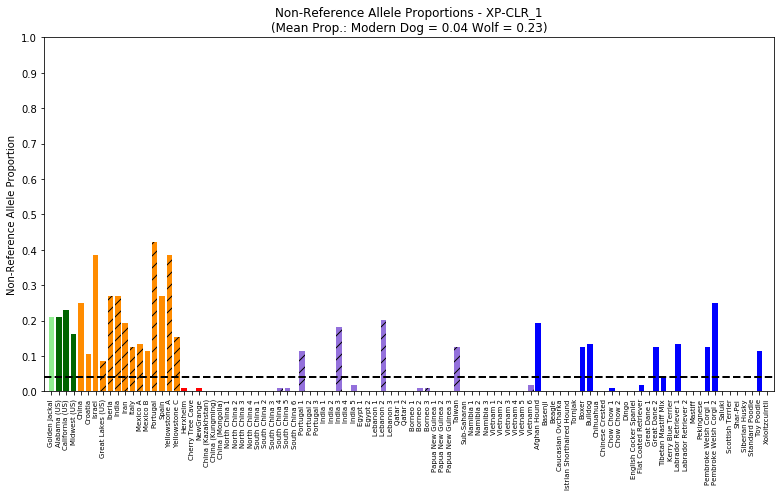

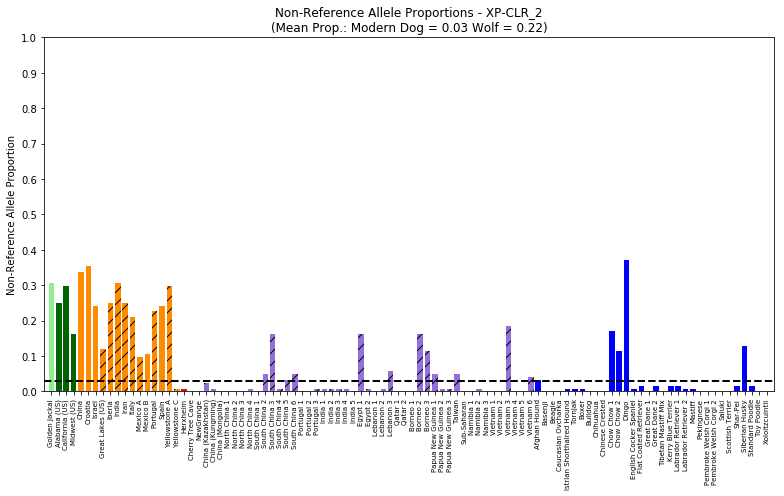

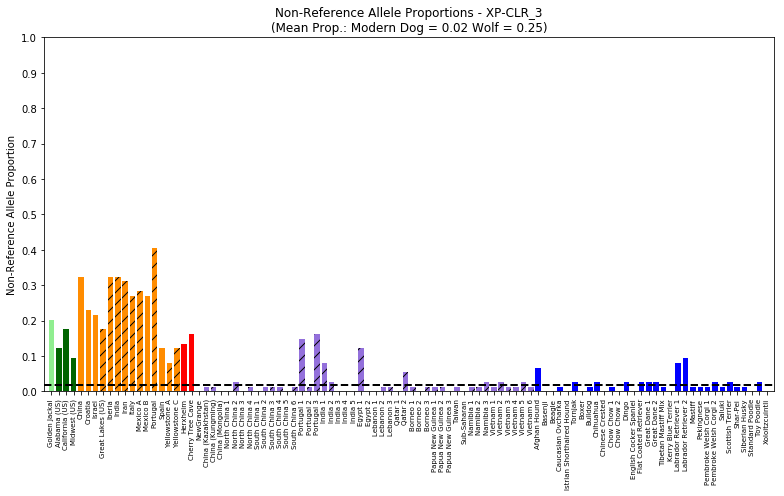

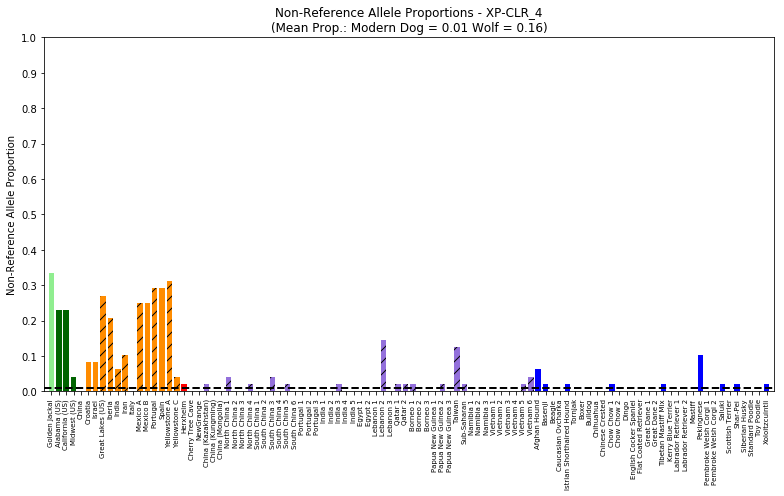

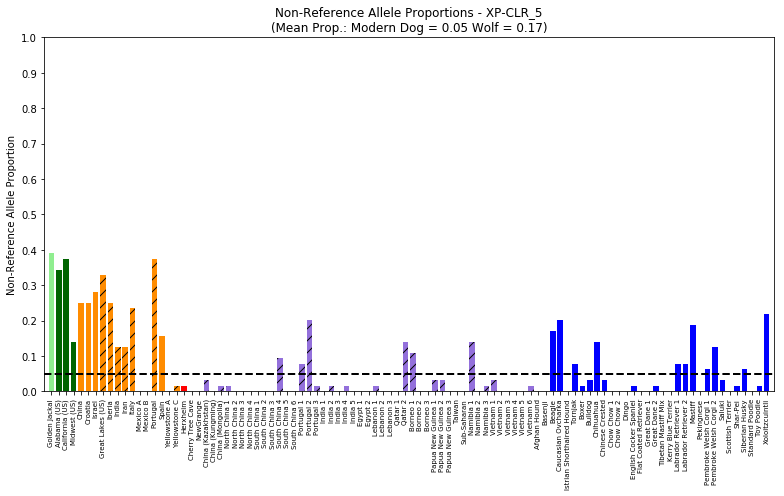

...

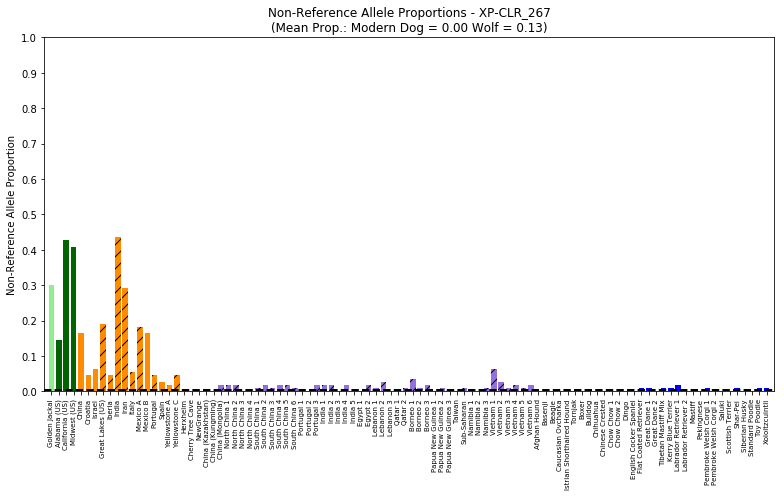

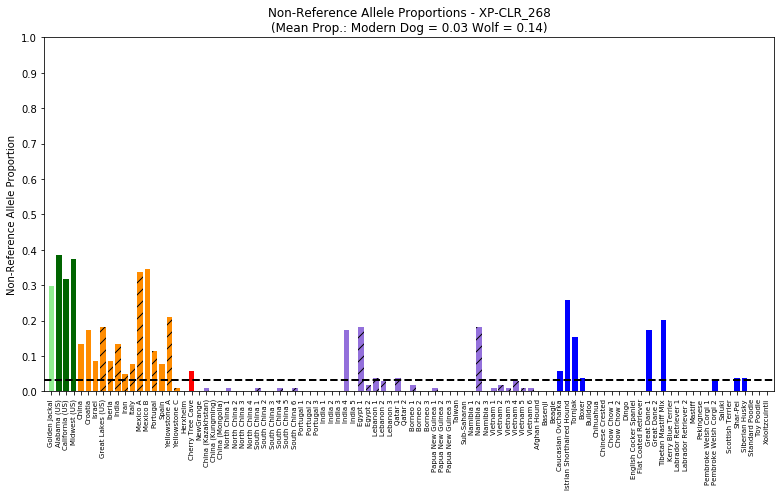

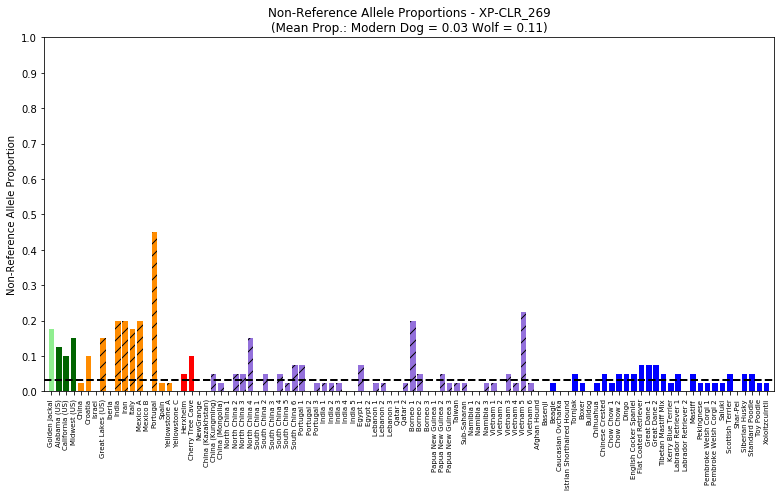

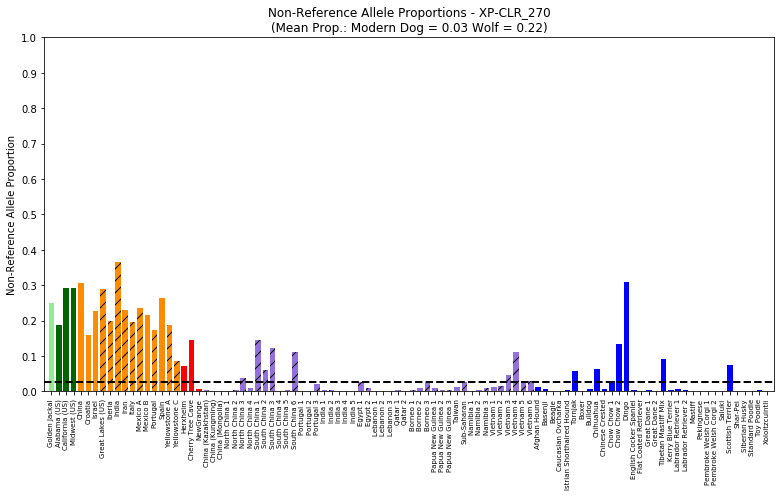

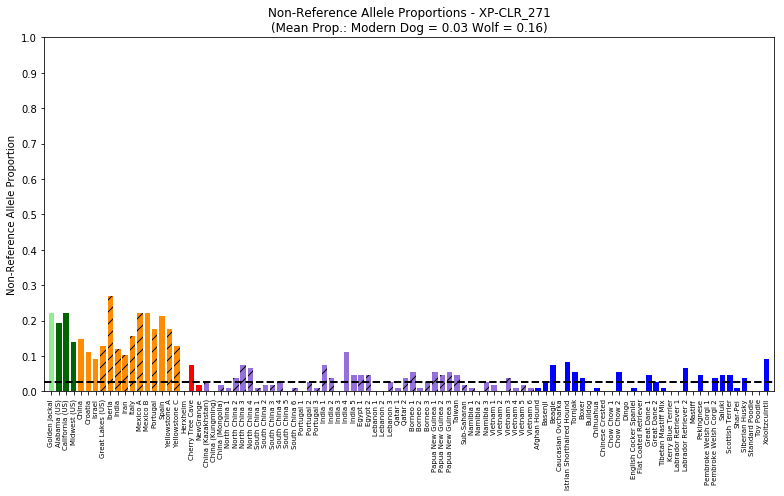

In [142]:
#Pendleton Primary FST sweeps
hapDir = wkDir
cdrfile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/XP-CLR/results/Campbell_No-MAF-Filter/50kbWindow_2kbGrid/Dogs_v_Wolves/SignificantWindows/Significant_1Window_simThreshold_AverageXP-CLRScore.txt'
cdrDict = get_cdr_Dict(cdrfile)

sampleDict = make_sample_dict(hapDir) #make dictionary of the canine IDs and types
RDplotOrder = determine_plot_order() #determine the order that the samples should be plotted
fstDogs = get_fst_dog_samples()

altPropSummaryFile = open(hapDir + 'results/' + 'AncientAlternateAlleleProportions_PrimaryFST.txt','w')
#write header for ancient alt allele prop file
altPropSummaryFile.write('CDR_ID\tCDR_Coordinates\tDog_AltProp_Average\tWolf_AltProp_Average\tMax_Dog_AltProp\tHXH_AltProp\tCTC_AltProp\tNGD_AltProp\n')

for cdr in range(1,len(cdrDict)+1):
    cdr = 'XP-CLR' + '_' + str(cdr)
    cdrChrom,cdrStart,cdrEnd = cdrDict[cdr][0],int(cdrDict[cdr][1]),int(cdrDict[cdr][2])
    if 'X' in cdrChrom:
        continue
    print('#%s' % cdr,cdrChrom,cdrStart,cdrEnd)
    colToSample,sampleToCol = {},{}
    vcfFileName = hapDir + 'input/' + 'XP-CLRExtracted_SNPs.vcf.gz'
    genotypeDict, snpCount = parse_VCF(sampleDict,vcfFileName)
    if len(genotypeDict) < 1: #This region didn't meet the SNP count requirement (SNPs>10)
        altPropSummaryFile.write('%s\t%s:%i-%i\t%s\t%s\t%s\t%s\t%s\t%s\n' % (cdr,cdrChrom,cdrStart,cdrEnd,'NA','NA','NA','NA','NA','NA'))
        continue
    altPropDict, wolfAverage, dogAverage,dogSD = calc_prop_alternate_allele(genotypeDict,snpCount)
    #print ancient averages
    cutoffs = [dogAverage-(2*dogSD),dogAverage+(2*dogSD)]
    ctc,hxh,ngd = find_ancient_outliers(cutoffs,altPropDict)
    altPropSummaryFile.write('%s\t%s:%i-%i\t%f\t%f\t%s\t%s\t%s\t%s\n' % (cdr,cdrChrom,cdrStart,cdrEnd,dogAverage,wolfAverage,"{0:.2f}".format(round(cutoffs[1],5)),hxh,ctc,ngd))
    #Draw bar plots of the region

    plotDir = hapDir + 'plots/'
    draw_allele_prop_plots(RDplotOrder,fstDogs,altPropDict,dogAverage,wolfAverage,dogSD)
    #break
altPropSummaryFile.close()

#  --------- AXELSSON FST ---------


In [18]:
axFile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Re-RunningAnalysis_NewScripts/FINAL_results/Axelsson_CaganBlass_Comparisons/FinalAxelssonLoci.txt'
real_axCoord = []

for line in open(axFile,'r'):
    line=line.rstrip().split()
    chrom,start,end,ID,FST,passHp = line[0],int(line[1]),int(line[2]),line[3], float(line[4]), line[5]
    real_axCoord.append([chrom,start,end,ID,FST,passHp,'Average Hp from No Ancients Data','Average Hp from WITH Ancients Data','Average Delta Hp','Ancients PASS/FAIL'])



In [20]:
#Getting the HP for our real fst data
failCount, windowCount = 0, 0
passWindows = []

for window in real_axCoord:
    windowChrom, windowStart, windowEnd = window[0],int(window[1]),int(window[2])
    ancientHp_Window, noAncientHp_Window, deltaHp_Window = [], [], []
    windowCount += 1
    
    for hpwindow in fst_hpCoord:
        hpWindowChrom, hpWindowStart, hpWindowEnd, noancientHp, ancientHp, deltaHp = hpwindow[0],int(hpwindow[1]),int(hpwindow[2]), float(hpwindow[3]), float(hpwindow[4]), float(hpwindow[5])
        if hpWindowChrom == windowChrom: #same chromosome
            windowStartDiff = abs(hpWindowStart-windowStart)
            windowEndDiff = abs(hpWindowEnd-windowEnd)
            if windowStartDiff < 50000 or windowEndDiff <50000:
                #print(hpwindow)
                ancientHp_Window.append(ancientHp)
                noAncientHp_Window.append(noancientHp)
                deltaHp_Window.append(deltaHp)
    avg_ancientHp_Window  = np.mean(ancientHp_Window)
    avg_noAncientHp_Window  = np.mean(noAncientHp_Window)
    avg_deltaHp = np.mean(deltaHp_Window)
    window[6] = avg_noAncientHp_Window
    window[7] = avg_ancientHp_Window
    window[8] = avg_deltaHp
    if avg_deltaHp < fst_pct5:
        window[9] = 'FAIL'
        failCount += 1
        print(window)
    else:
        window[9] = 'PASS'
        passWindows.append(window)
    
failProp = (failCount/float(windowCount)) * 100
print('%i/%i (%f%%) windows fail from Axelsson FST analysis' % (failCount,windowCount,failProp)) 



['chr6', 46854109, 47454177, 'AX_12', 0.0956942838379, 'FAIL', 0.100868949169475, 0.10813541146985001, -0.0072664623003749935, 'FAIL']
['chr7', 24632212, 25033464, 'AX_14', 0.136428182489, 'FAIL', 0.15339158840549999, 0.15974192946475002, -0.0063503410592500031, 'FAIL']
2/30 (6.666667%) windows fail from Axelsson FST analysis


#  --------- CAGAN/BLASS FST ---------


In [21]:
cbFile = '/home/ampend/links/kidd-lab/ampend-projects/Angela/Re-RunningAnalysis_NewScripts/FINAL_results/Axelsson_CaganBlass_Comparisons/HpFiltered_FinalCaganBlassLoci.txt'
real_cbCoord = []

for line in open(cbFile,'r'):
    if 'Start' in line: #skips header
        continue
    line=line.rstrip().split()
    chrom,start,end,ID,FST,passHp = line[0],int(line[1]),int(line[2]),line[3], float(line[4]), line[5]
    real_cbCoord.append([chrom,start,end,ID,FST,passHp,'Average Hp from No Ancients Data','Average Hp from WITH Ancients Data','Average Delta Hp','Ancients PASS/FAIL'])



In [22]:
#Getting the HP for our real fst data
failCount, windowCount = 0, 0
passWindows = []

for window in real_cbCoord:
    windowChrom, windowStart, windowEnd = window[0],int(window[1]),int(window[2])
    ancientHp_Window, noAncientHp_Window, deltaHp_Window = [], [], []
    windowCount += 1
    
    for hpwindow in fst_hpCoord:
        hpWindowChrom, hpWindowStart, hpWindowEnd, noancientHp, ancientHp, deltaHp = hpwindow[0],int(hpwindow[1]),int(hpwindow[2]), float(hpwindow[3]), float(hpwindow[4]), float(hpwindow[5])
        if hpWindowChrom == windowChrom: #same chromosome
            windowStartDiff = abs(hpWindowStart-windowStart)
            windowEndDiff = abs(hpWindowEnd-windowEnd)
            if windowStartDiff < 50000 or windowEndDiff <50000:
                #print(hpwindow)
                ancientHp_Window.append(ancientHp)
                noAncientHp_Window.append(noancientHp)
                deltaHp_Window.append(deltaHp)
    avg_ancientHp_Window  = np.mean(ancientHp_Window)
    avg_noAncientHp_Window  = np.mean(noAncientHp_Window)
    avg_deltaHp = np.mean(deltaHp_Window)
    window[6] = avg_noAncientHp_Window
    window[7] = avg_ancientHp_Window
    window[8] = avg_deltaHp
    if avg_deltaHp < fst_pct5:
        window[9] = 'FAIL'
        failCount += 1
        print(window)
    else:
        window[9] = 'PASS'
        passWindows.append(window)
    
failProp = (failCount/float(windowCount)) * 100
print('%i/%i (%f%%) windows fail from Axelsson FST analysis' % (failCount,windowCount,failProp)) 



['chr6', 47000000, 47500000, 'CB_3', 0.0739507930444, 'PASS', 0.079926165730600005, 0.088549747797933329, -0.008623582067333331, 'FAIL']
1/4 (25.000000%) windows fail from Axelsson FST analysis
